In [1]:
import scenicplus

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
_stderr = sys.stderr
null = open(os.devnull,'wb')

In [7]:
import os
work_dir = 'NFYA'

In [8]:
import scanpy as sc
import numpy as np
import pandas as pd
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 5), facecolor='white')

#make a directory for to store the processed scRNA-seq data.
if not os.path.exists(os.path.join(work_dir, 'scRNA')):
    os.makedirs(os.path.join(work_dir, 'scRNA'))

In [9]:
import scanpy as sc
adata = sc.read_h5ad(os.path.join(work_dir, 'scRNA/NFYAN.h5ad'))

In [10]:
adata

AnnData object with n_obs × n_vars = 7829 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'stim', 'celltype', 'CM41', 'merged', 'New'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'New_colors', 'celltype.stim_colors', 'merged_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

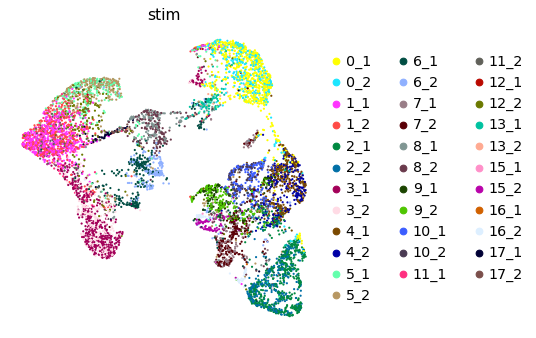

In [11]:
sc.pl.umap(adata, color = ['stim'])

In [12]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'FVCM1': ['0_1', '0_2'], 'FVCM2': ['4_1', '4_2'], 'CME': ['2_1','2_2'], 'VCM1': ['16_1', '16_2','7_1','7_2'],
    'VCM2': ['10_1','10_2'], 'TVCM1': ['9_1','9_2'], 'TVCM2': ['5_1','5_2'], 'MCM1': ['1_1', '1_2', '12_1','12_2'], 'MCM2': ['11_1','11_2','17_1','17_2'], 'MCM3': ['3_1', '3_2'], 'ACM1': ['13_1','13_2'], 'ACM2': ['6_1','6_2','15_1', '15_2'], 'CCS':['8_1','8_2']}


In [13]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,celltype,CM41,merged,New
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2
AAACAGCCAGTTATGT-2,0,21009.0,6064,0.052359,39245.0,15959,5826.0,3070,0.502863,0.497137,16,7,2,7_2,3,-0.068425,NaN,VCM1
AAACAGCCATCCCGCT-2,0,33012.0,7741,4.377196,8053.0,4105,6220.0,3663,0.614274,0.385726,2,10,2,10_2,4,0.634693,NaN,VCM2
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCGTAGG-1,0,5357.0,2325,0.018667,3965.0,1997,5408.0,2325,0.638828,0.361172,1,1,1,1_1,7,-0.100835,NaN,MCM1
TTTGTTGGTCTTTGAC-1,0,2287.0,1321,0.087451,779.0,413,4838.0,1456,0.848081,0.151919,1,1,1,1_1,7,-0.049111,NaN,MCM1
TTTGTTGGTTCCGCAC-1,0,10236.0,4185,1.670574,14455.0,6763,6649.0,3884,0.637625,0.362375,2,10,1,10_1,4,0.282355,NaN,VCM2
TTTGTTGGTTGAATCG-2,0,4301.0,2043,0.023250,507.0,284,5028.0,2043,0.986706,0.013294,1,1,2,1_2,7,-0.107964,NaN,MCM1


In [14]:
adata.obs.rename(columns={"celltype": "clusterno"}, inplace=True)
adata.obs.rename(columns={"New": "celltype"}, inplace=True)
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,clusterno,CM41,merged,celltype
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2
AAACAGCCAGTTATGT-2,0,21009.0,6064,0.052359,39245.0,15959,5826.0,3070,0.502863,0.497137,16,7,2,7_2,3,-0.068425,NaN,VCM1
AAACAGCCATCCCGCT-2,0,33012.0,7741,4.377196,8053.0,4105,6220.0,3663,0.614274,0.385726,2,10,2,10_2,4,0.634693,NaN,VCM2
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCGTAGG-1,0,5357.0,2325,0.018667,3965.0,1997,5408.0,2325,0.638828,0.361172,1,1,1,1_1,7,-0.100835,NaN,MCM1
TTTGTTGGTCTTTGAC-1,0,2287.0,1321,0.087451,779.0,413,4838.0,1456,0.848081,0.151919,1,1,1,1_1,7,-0.049111,NaN,MCM1
TTTGTTGGTTCCGCAC-1,0,10236.0,4185,1.670574,14455.0,6763,6649.0,3884,0.637625,0.362375,2,10,1,10_1,4,0.282355,NaN,VCM2
TTTGTTGGTTGAATCG-2,0,4301.0,2043,0.023250,507.0,284,5028.0,2043,0.986706,0.013294,1,1,2,1_2,7,-0.107964,NaN,MCM1


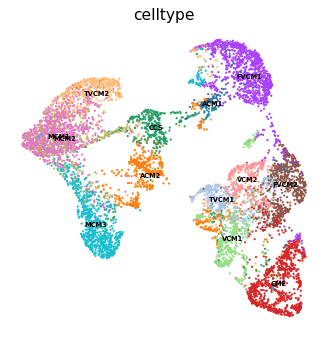

In [15]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.stim).isin(cell_dict[i])
    adata.obs.loc[ind,'celltype'] = i

sc.pl.umap(adata, color=['celltype'], legend_loc='on data', legend_fontsize=6, save='_new_lbl')

In [16]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,clusterno,CM41,merged,celltype
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2
AAACAGCCAGTTATGT-2,0,21009.0,6064,0.052359,39245.0,15959,5826.0,3070,0.502863,0.497137,16,7,2,7_2,3,-0.068425,NaN,VCM1
AAACAGCCATCCCGCT-2,0,33012.0,7741,4.377196,8053.0,4105,6220.0,3663,0.614274,0.385726,2,10,2,10_2,4,0.634693,NaN,VCM2
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCGTAGG-1,0,5357.0,2325,0.018667,3965.0,1997,5408.0,2325,0.638828,0.361172,1,1,1,1_1,7,-0.100835,NaN,MCM1
TTTGTTGGTCTTTGAC-1,0,2287.0,1321,0.087451,779.0,413,4838.0,1456,0.848081,0.151919,1,1,1,1_1,7,-0.049111,NaN,MCM1
TTTGTTGGTTCCGCAC-1,0,10236.0,4185,1.670574,14455.0,6763,6649.0,3884,0.637625,0.362375,2,10,1,10_1,4,0.282355,NaN,VCM2
TTTGTTGGTTGAATCG-2,0,4301.0,2043,0.023250,507.0,284,5028.0,2043,0.986706,0.013294,1,1,2,1_2,7,-0.107964,NaN,MCM1


In [17]:
adata.write_h5ad('NFYANn.h5ad')

In [18]:
adata.obs.groupby('sample').count()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,stim,clusterno,CM41,merged,celltype
sample,,,,,,,,,,,,,,,,,
1,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,4274,2077,4274
2,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,3555,1492,3555


In [19]:
adata

AnnData object with n_obs × n_vars = 7829 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'stim', 'clusterno', 'CM41', 'merged', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'New_colors', 'celltype.stim_colors', 'merged_colors', 'stim_colors', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [20]:
adata.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,clusterno,CM41,merged,celltype
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2
AAACAGCCAGTTATGT-2,0,21009.0,6064,0.052359,39245.0,15959,5826.0,3070,0.502863,0.497137,16,7,2,7_2,3,-0.068425,NaN,VCM1
AAACAGCCATCCCGCT-2,0,33012.0,7741,4.377196,8053.0,4105,6220.0,3663,0.614274,0.385726,2,10,2,10_2,4,0.634693,NaN,VCM2
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1


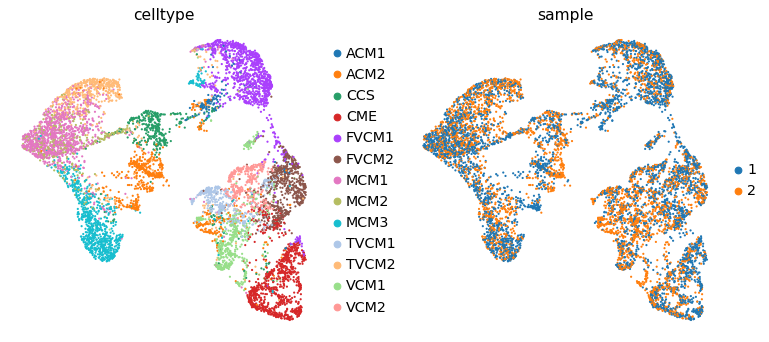

In [21]:
sc.pl.umap(adata, color=['celltype', 'sample'], save ='_new&sample_lbl')

In [34]:
adata.obs.celltype.unique().tolist()

['TVCM2',
 'VCM1',
 'VCM2',
 'CME',
 'MCM3',
 'MCM1',
 'ACM1',
 'FVCM2',
 'FVCM1',
 'TVCM1',
 'MCM2',
 'CCS',
 'ACM2']

In [35]:
sample_dict = {'1': ['0_1', '1_1', '2_1', '3_1', '4_1', '5_1', '6_1', '7_1', '8_1', '9_1', '10_1', '11_1', '12_1', '13_1', '15_1', '16_1', '17_1'], 
             '2': ['0_2', '1_2', '2_2', '3_2', '4_2', '5_2', '6_2', '7_2', '8_2', '9_2', '10_2', '11_2', '12_2', '13_2', '15_2', '16_2', '17_2']}


In [37]:
# Initialize empty column in cell metadata
adata.obs['exp'] = np.nan

... storing 'exp' as categorical


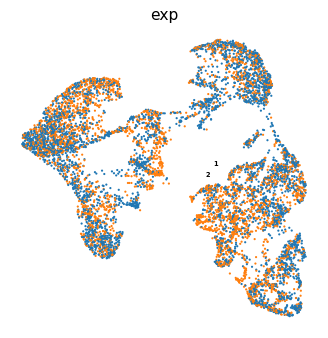

In [38]:
for i in sample_dict.keys():
    ind = pd.Series(adata.obs.stim).isin(sample_dict[i])
    adata.obs.loc[ind,'exp'] = i

sc.pl.umap(adata, color=['exp'], legend_loc='on data', legend_fontsize=6)

In [39]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,clusterno,CM41,merged,celltype,exp
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2,1
AAACAGCCAGTTATGT-2,0,21009.0,6064,0.052359,39245.0,15959,5826.0,3070,0.502863,0.497137,16,7,2,7_2,3,-0.068425,NaN,VCM1,2
AAACAGCCATCCCGCT-2,0,33012.0,7741,4.377196,8053.0,4105,6220.0,3663,0.614274,0.385726,2,10,2,10_2,4,0.634693,NaN,VCM2,2
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME,1
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCGTAGG-1,0,5357.0,2325,0.018667,3965.0,1997,5408.0,2325,0.638828,0.361172,1,1,1,1_1,7,-0.100835,NaN,MCM1,1
TTTGTTGGTCTTTGAC-1,0,2287.0,1321,0.087451,779.0,413,4838.0,1456,0.848081,0.151919,1,1,1,1_1,7,-0.049111,NaN,MCM1,1
TTTGTTGGTTCCGCAC-1,0,10236.0,4185,1.670574,14455.0,6763,6649.0,3884,0.637625,0.362375,2,10,1,10_1,4,0.282355,NaN,VCM2,1
TTTGTTGGTTGAATCG-2,0,4301.0,2043,0.023250,507.0,284,5028.0,2043,0.986706,0.013294,1,1,2,1_2,7,-0.107964,NaN,MCM1,2


In [40]:
adata[adata.obs.exp == '1']

View of AnnData object with n_obs × n_vars = 4274 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'stim', 'clusterno', 'CM41', 'merged', 'celltype', 'exp'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'New_colors', 'celltype.stim_colors', 'merged_colors', 'stim_colors', 'celltype_colors', 'sample_colors', 'exp_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [41]:
bdata = adata[adata.obs.exp == '1']

In [42]:
bdata

View of AnnData object with n_obs × n_vars = 4274 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'stim', 'clusterno', 'CM41', 'merged', 'celltype', 'exp'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'New_colors', 'celltype.stim_colors', 'merged_colors', 'stim_colors', 'celltype_colors', 'sample_colors', 'exp_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [43]:
bdata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,sample,stim,clusterno,CM41,merged,celltype,exp
AAACAGCCACCGGCTA-1,0,9302.0,3347,0.032251,23096.0,10495,6386.0,3212,0.519106,0.480894,14,5,1,5_1,6,-0.118169,NaN,TVCM2,1
AAACATGCACCAACCG-1,0,23692.0,6506,1.346446,44370.0,18683,5856.0,3221,0.810436,0.189564,11,2,1,2_1,2,0.345746,FVCM1,CME,1
AAACATGCACCATATG-1,0,13467.0,4691,4.054355,24013.0,10938,6313.0,3482,0.706792,0.293208,16,7,1,7_1,3,0.246527,NaN,VCM1,1
AAACATGCAGGAACTG-1,0,3286.0,1831,0.000000,11183.0,5311,4896.0,1841,0.659492,0.340508,12,3,1,3_1,9,-0.088302,NaN,MCM3,1
AAACATGCAGTAAAGC-1,0,4542.0,2217,0.000000,11192.0,5409,5031.0,2217,0.975352,0.024648,12,3,1,3_1,9,-0.086577,NaN,MCM3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCGTTCACC-1,0,34720.0,7075,5.195853,46462.0,18610,5833.0,2956,0.739654,0.260346,11,2,1,2_1,2,0.539797,FVCM1,CME,1
TTTGTTGGTACCGAAC-1,0,19875.0,5535,4.407547,22614.0,10055,5790.0,2863,0.568462,0.431538,2,10,1,10_1,4,0.455682,NaN,VCM2,1
TTTGTTGGTCCGTAGG-1,0,5357.0,2325,0.018667,3965.0,1997,5408.0,2325,0.638828,0.361172,1,1,1,1_1,7,-0.100835,NaN,MCM1,1
TTTGTTGGTCTTTGAC-1,0,2287.0,1321,0.087451,779.0,413,4838.0,1456,0.848081,0.151919,1,1,1,1_1,7,-0.049111,NaN,MCM1,1


In [44]:
bdata.write_h5ad('bdata.h5ad')

In [45]:
cdata = adata[adata.obs.exp == '2']
cdata

View of AnnData object with n_obs × n_vars = 3555 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'stim', 'clusterno', 'CM41', 'merged', 'celltype', 'exp'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'New_colors', 'celltype.stim_colors', 'merged_colors', 'stim_colors', 'celltype_colors', 'sample_colors', 'exp_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [46]:
cdata.write_h5ad('cdata.h5ad')

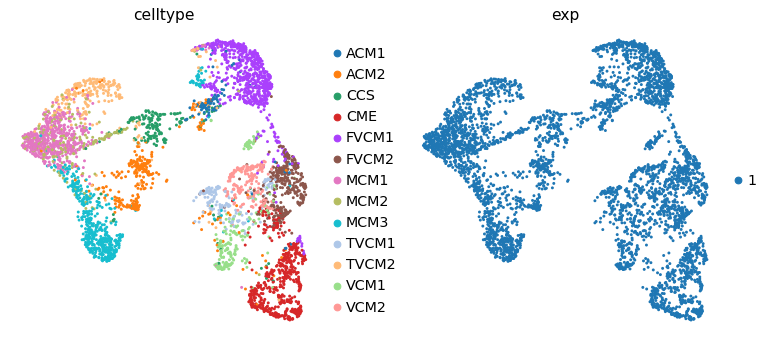

In [49]:
sc.pl.umap(bdata, color=['celltype', 'exp'], save ='_exp1_lbl')

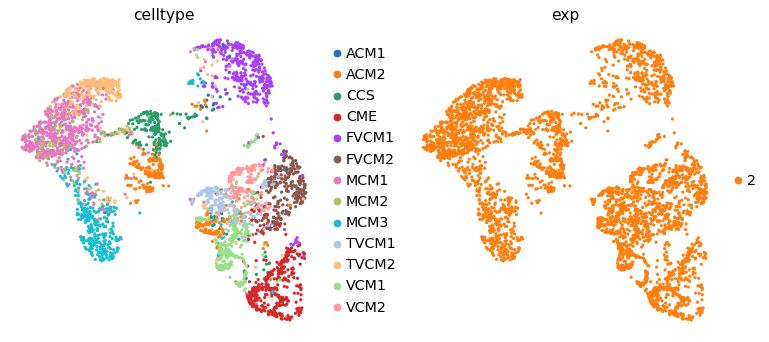

In [50]:
sc.pl.umap(cdata, color=['celltype', 'exp'], save ='_exp2_lbl')

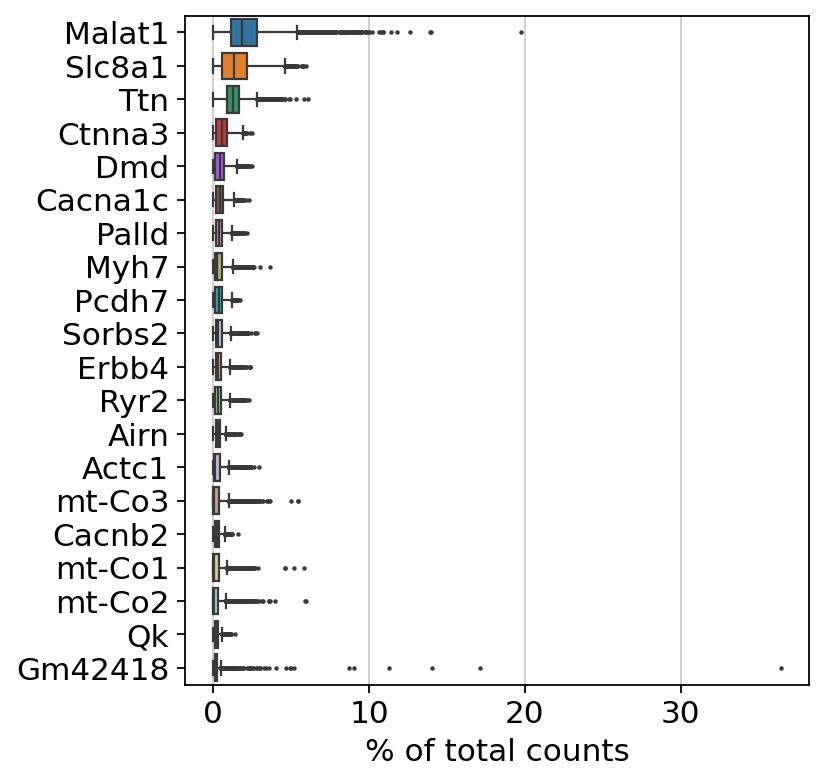

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20,)


In [8]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [9]:
#sc.external.pp.scrublet(adata) 

In [10]:
#adata = adata[adata.obs['predicted_doublet'] == False] #do the actual filtering
adata

AnnData object with n_obs × n_vars = 8706 × 22763
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


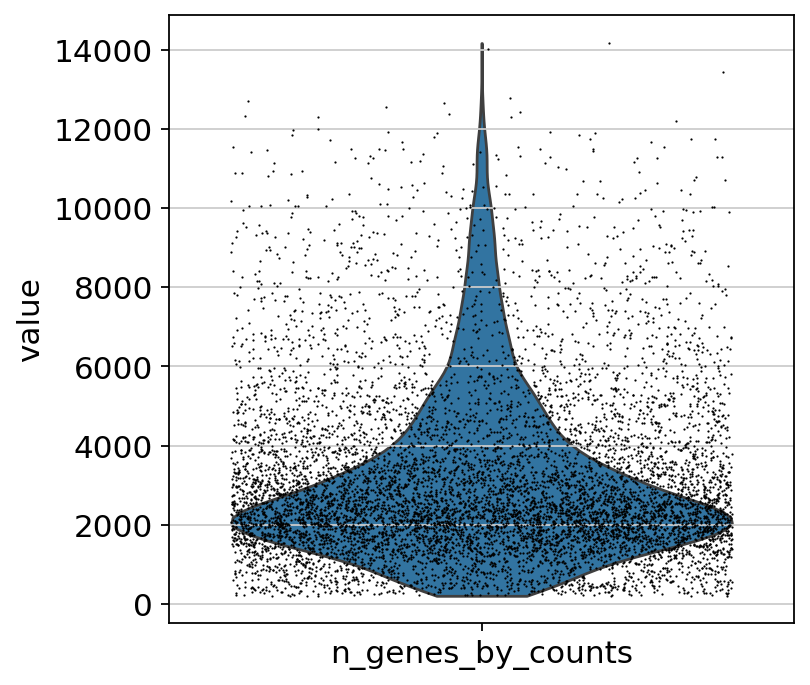

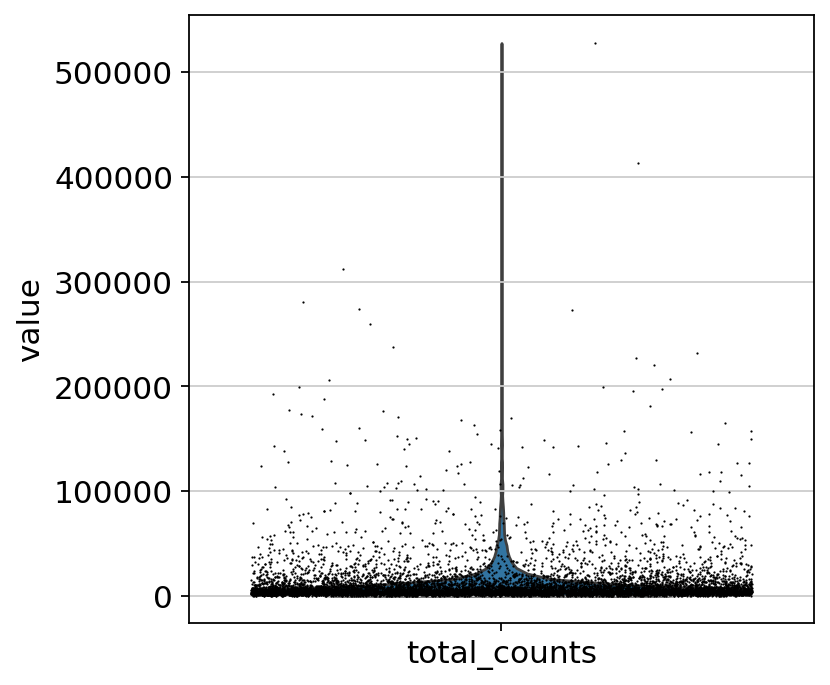

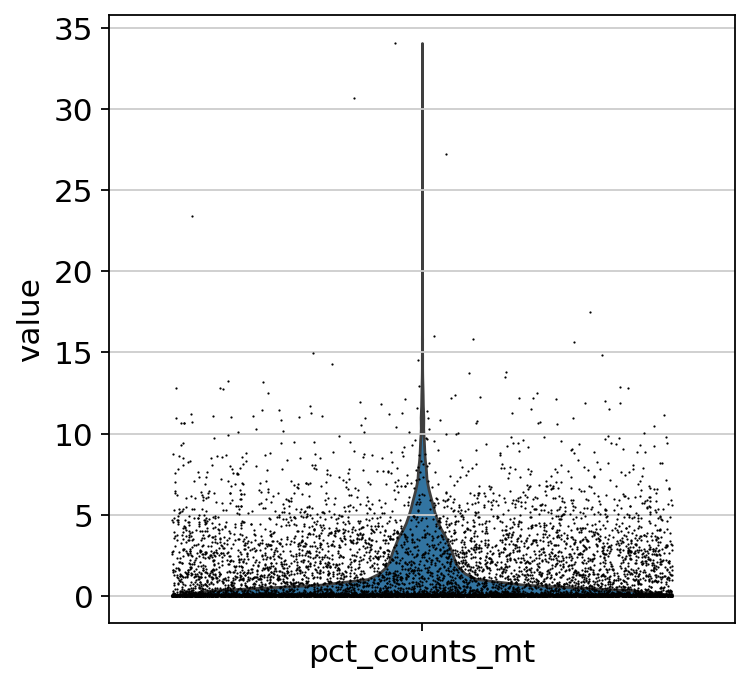

In [12]:
sc.pl.violin(adata, ['n_genes_by_counts'], save='_n_genes', jitter=0.4)
sc.pl.violin(adata, ['total_counts'], save='_total_counts', jitter=0.4)
sc.pl.violin(adata, ['pct_counts_mt'], save='_mito_pct', jitter=0.4)

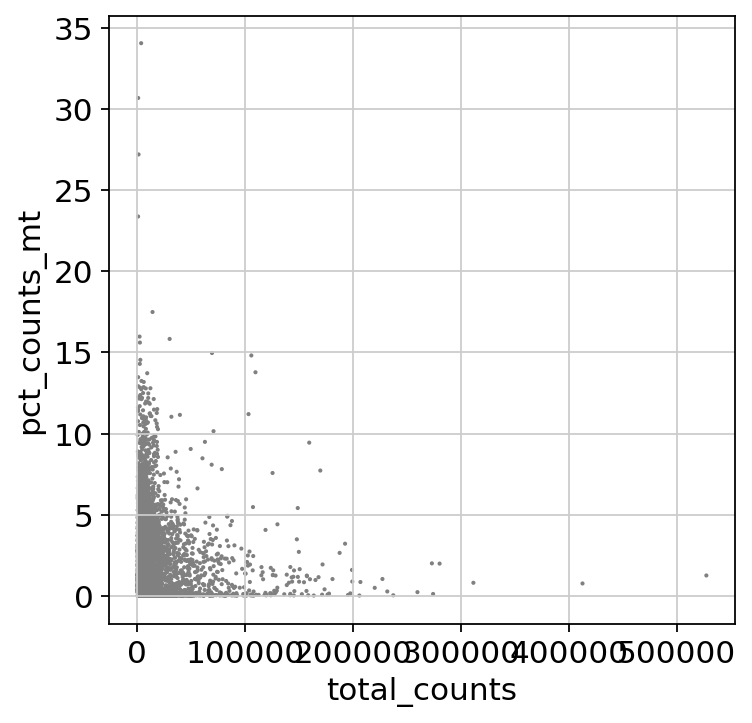

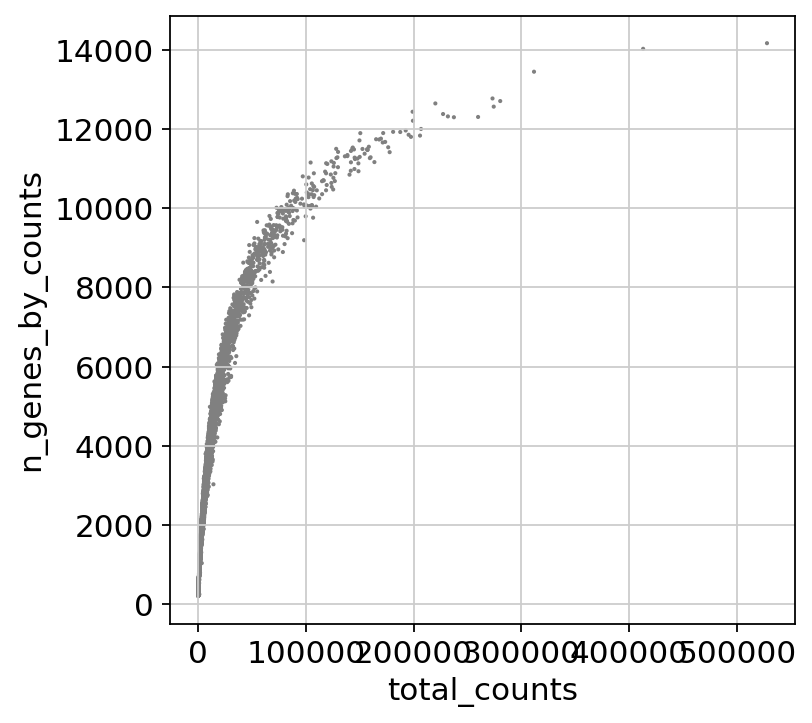

In [13]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [14]:
# Filter the data
adata = adata[adata.obs.n_genes_by_counts < 12000,:]
adata = adata[adata.obs.total_counts < 60000,:]
adata = adata[adata.obs.pct_counts_mt < 10,:]
adata.shape # Checking number of cells remaining

(8369, 22763)

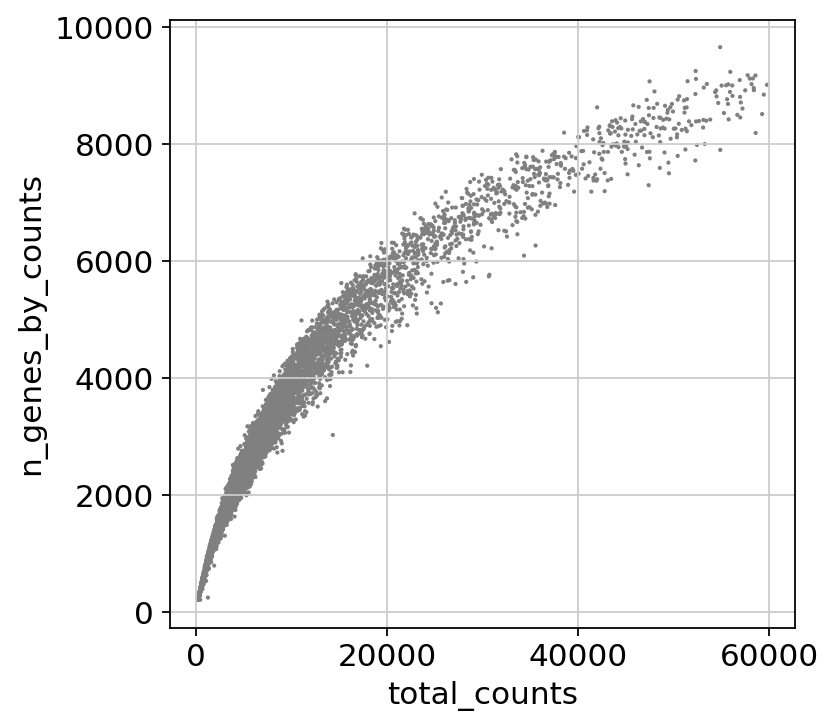

In [15]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import os
import scipy.io as sio
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', save='_gene_vs_transcript_counts')

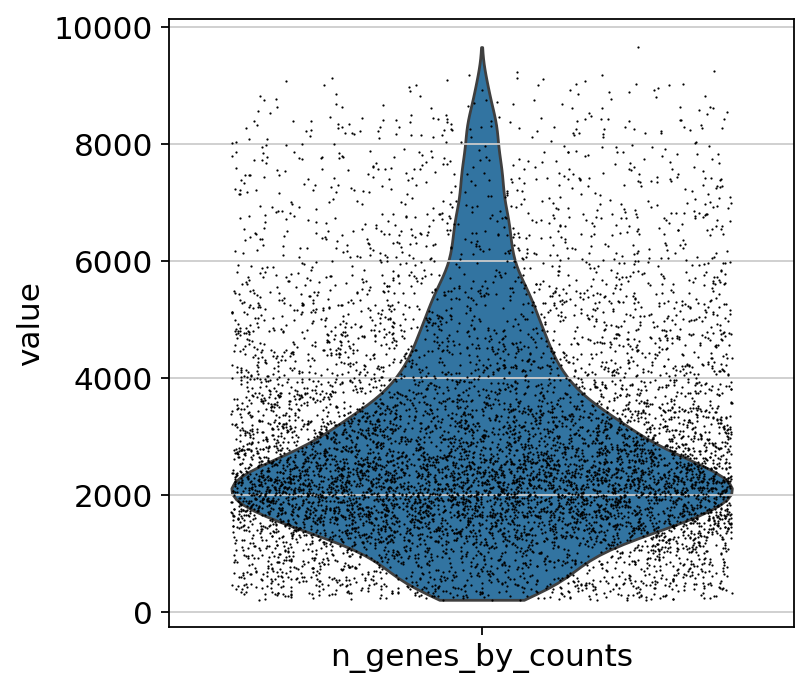

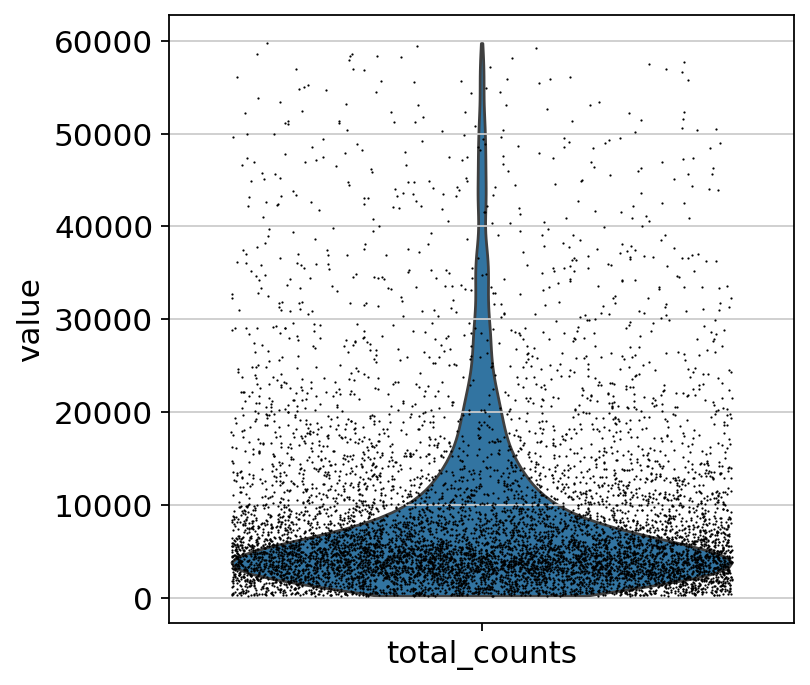

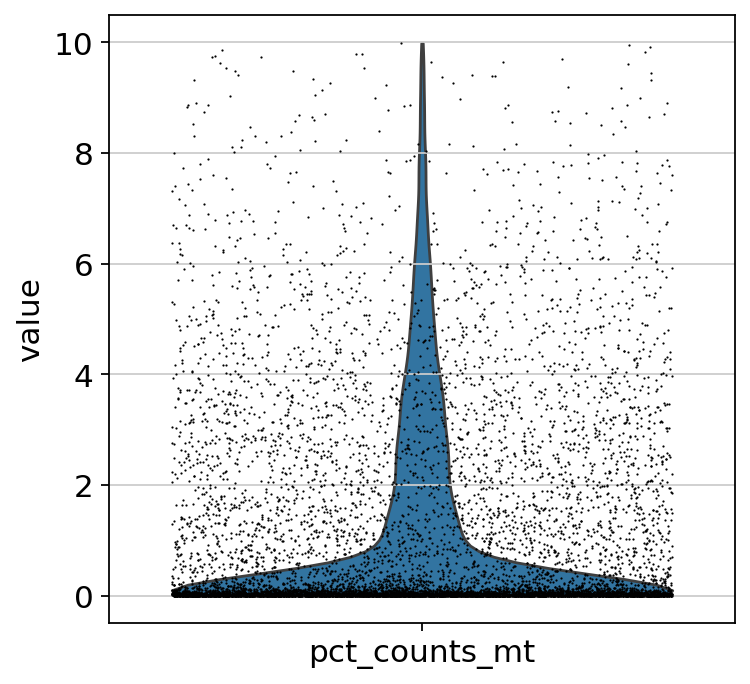

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts'], save='_n_genes', jitter=0.4)
sc.pl.violin(adata, ['total_counts'], save='_total_counts', jitter=0.4)
sc.pl.violin(adata, ['pct_counts_mt'], save='_mito_pct', jitter=0.4)

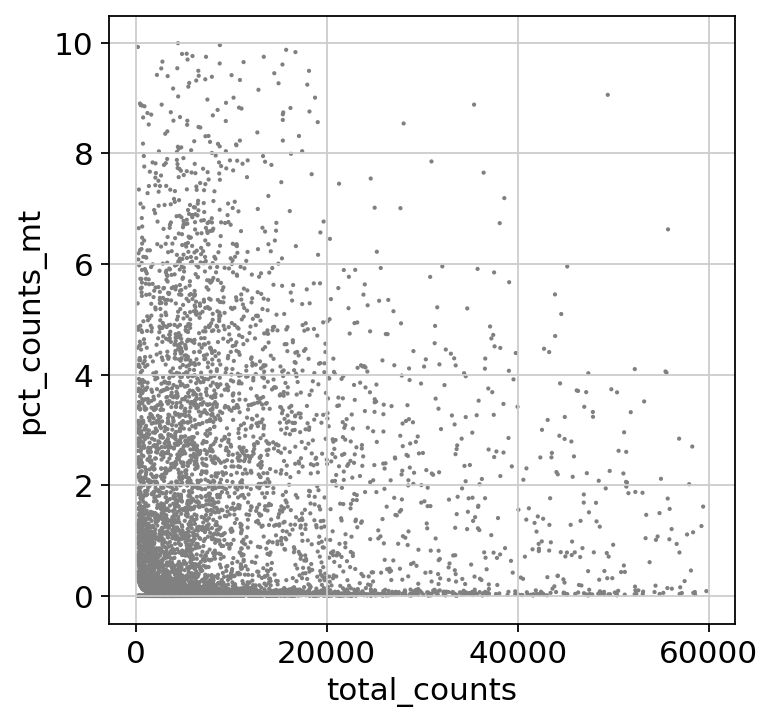

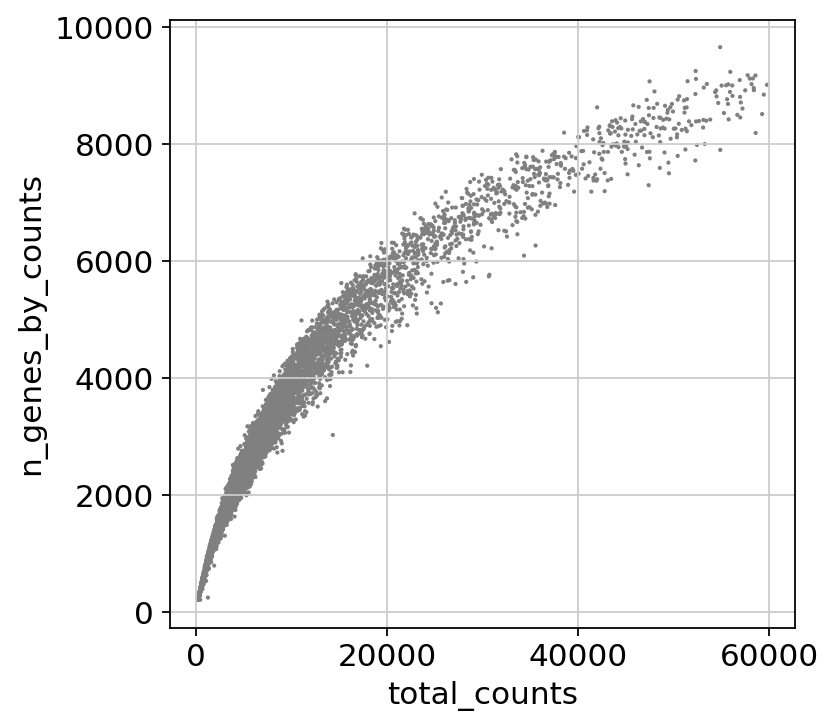

In [17]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [18]:
adata

View of AnnData object with n_obs × n_vars = 8369 × 22763
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


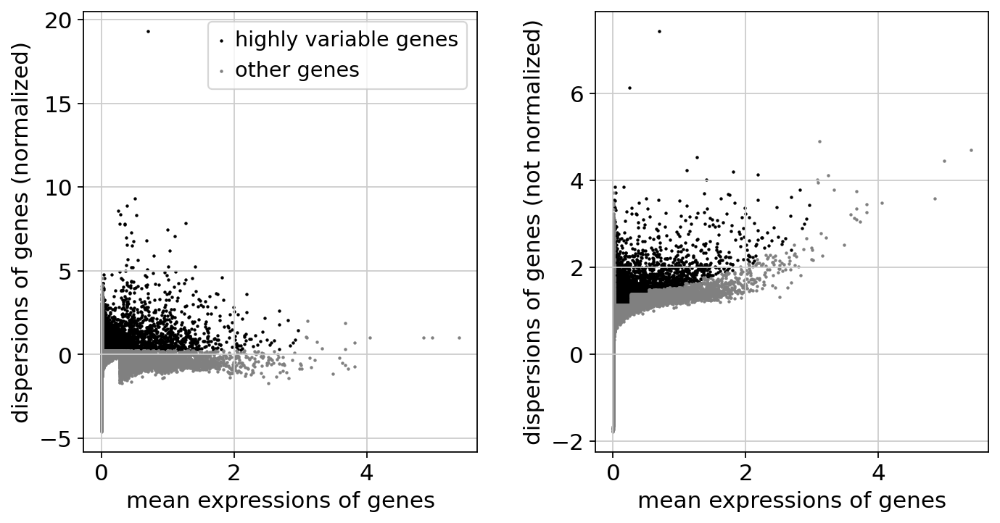

In [20]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.25)
sc.pl.highly_variable_genes(adata, save='') # scanpy generates the filename automatically

# Save raw expression values before variable gene subset
adata.raw = adata

adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts'])
sc.pp.scale(adata, max_value=10)

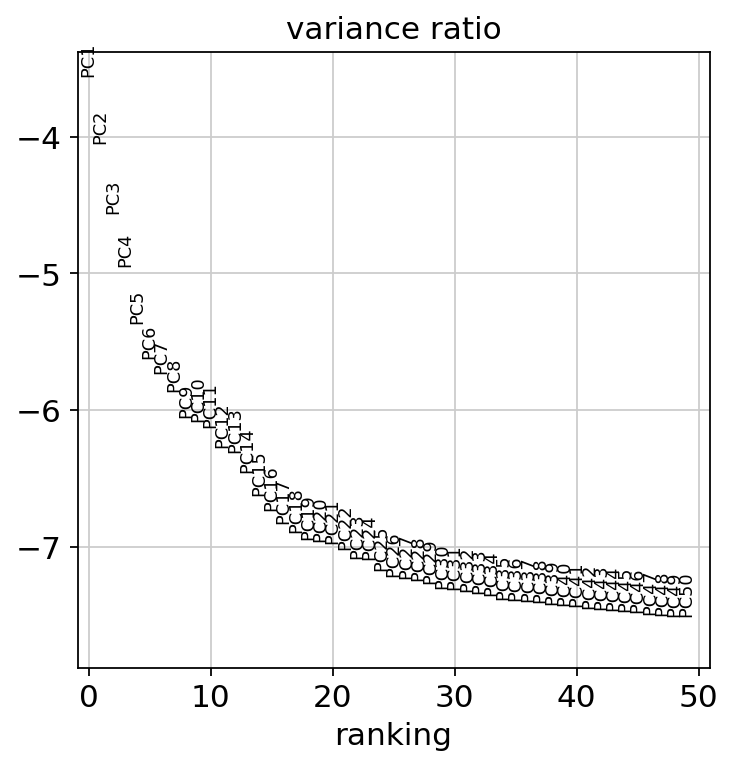

In [21]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50, save='') # scanpy generates the filename automatically

/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


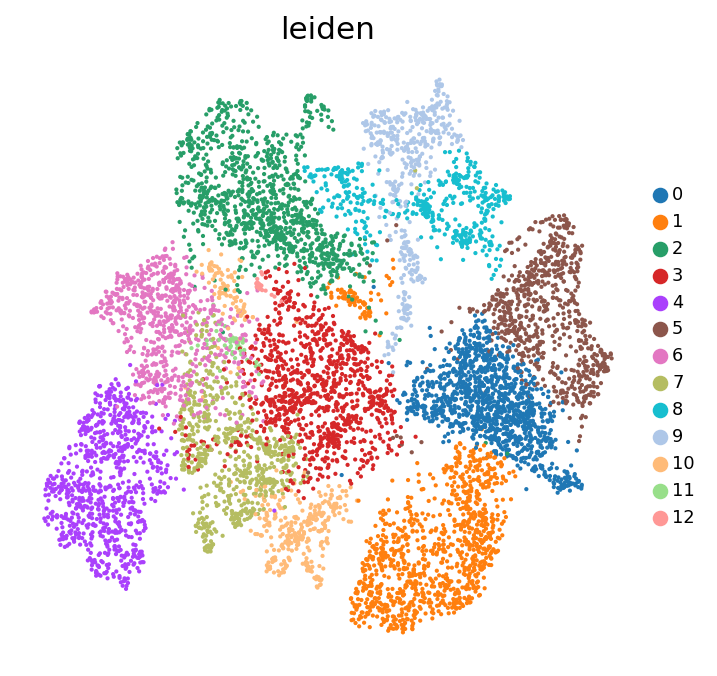

In [22]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.45)
sc.pl.umap(adata, color=['leiden'], legend_fontsize=8, save='_leiden')

In [23]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')

# The head function returns the top n genes per cluster
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(15)
print(top_markers)

          0        1        2        3       4              5         6  \
0   Cacna1c   Ctnna3  Slc25a4      Ttn   Bicc1         Ctnna3    mt-Co3   
1    Slc8a1  Cacna1c    Atp5b   mt-Co2    Meg3            Dmd    mt-Co1   
2    Ctnna3    Pcdh7     Myl3   mt-Co3  Plxna4         Slc8a1   mt-Cytb   
3     Palld      Dmd   Cox4i1   mt-Co1   Sulf1        Cacna1c    mt-Co2   
4     Rbm20   Slc8a1    Gapdh   Slc8a1  Sema3d         Mpped2    mt-Nd1   
5    Sorbs2   Cacnb2    Actc1    Mecom   Slit3           Trdn   mt-Atp6   
6      Ryr2   Sorbs2     Idh2  mt-Atp6   Cdh11       Rabgap1l    mt-Nd2   
7     Pcdh7   Diaph3   Cox6a1   mt-Nd1   Syne2          Palld     Gapdh   
8        Qk    Esrrg   Atp5a1     Ebf1  Col1a2          Fgf13    mt-Nd4   
9    Cacnb2    Palld    Tnni1     Myh7   Gpm6a          Pcdh7  Hsp90ab1   
10      Dmd    Cenpp    Tnnc1    Nrxn3   Magi2  5430431A17Rik    Eef1a1   
11     Cdh2   Trim55   mt-Co3    Elmo1    Cdon           Ryr2   Slc25a4   
12   Trim55     Ryr2   mt

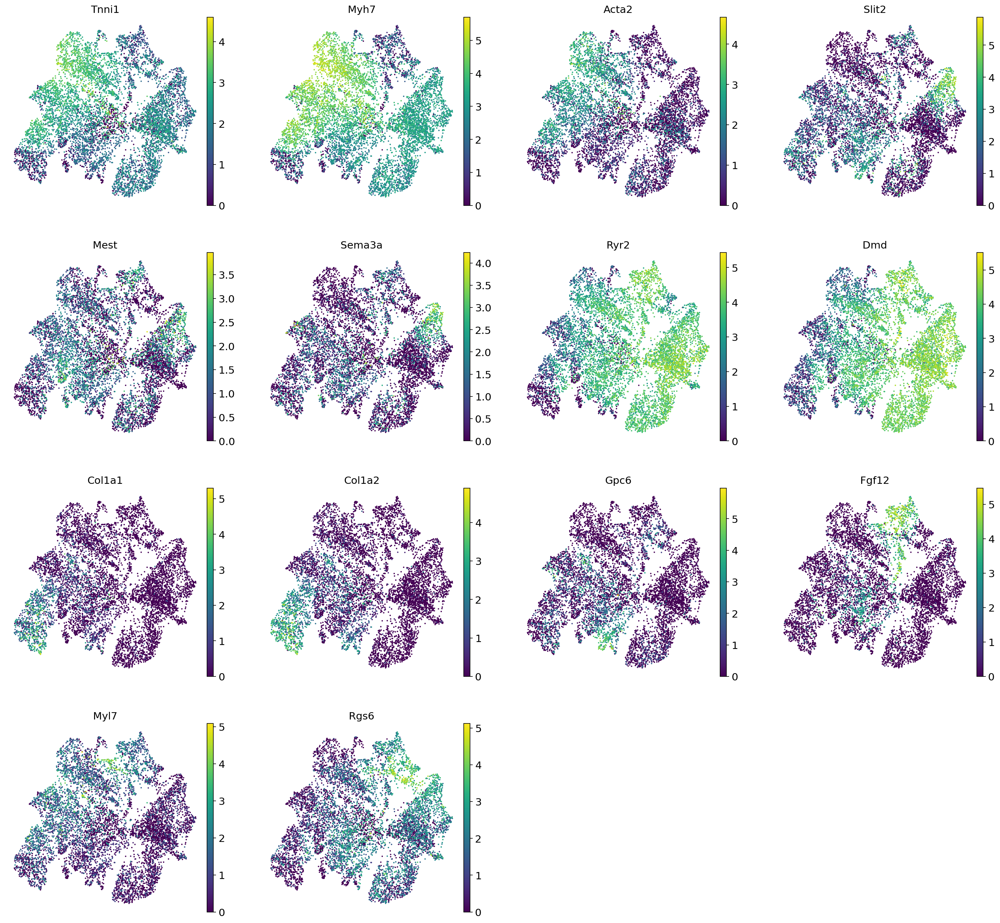

In [24]:
gene_list = ['Tnni1', 'Myh7', 'Acta2', 'Slit2', 'Mest', 'Sema3a','Ryr2','Dmd','Col1a1', 'Col1a2', 'Gpc6', 'Fgf12', 'Myl7', 'Rgs6']

sc.pl.umap(adata, color=[i for i in gene_list], color_map='viridis', legend_fontsize=8, save='_NFYA_markers')

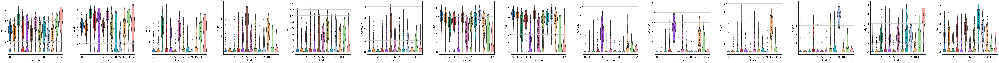

In [25]:
sc.pl.violin(adata, [i for i in gene_list], groupby='leiden')

/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error 

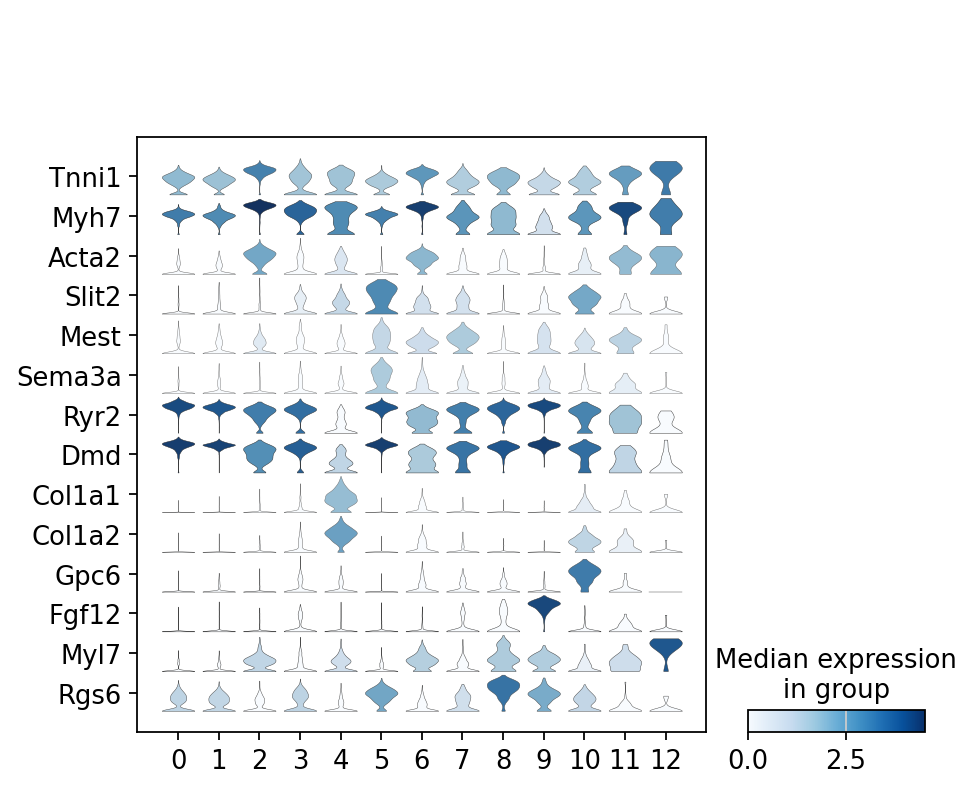

In [26]:
sc.pl.stacked_violin(adata, [i for i in gene_list], groupby='leiden', swap_axes = True, size= 2);

/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


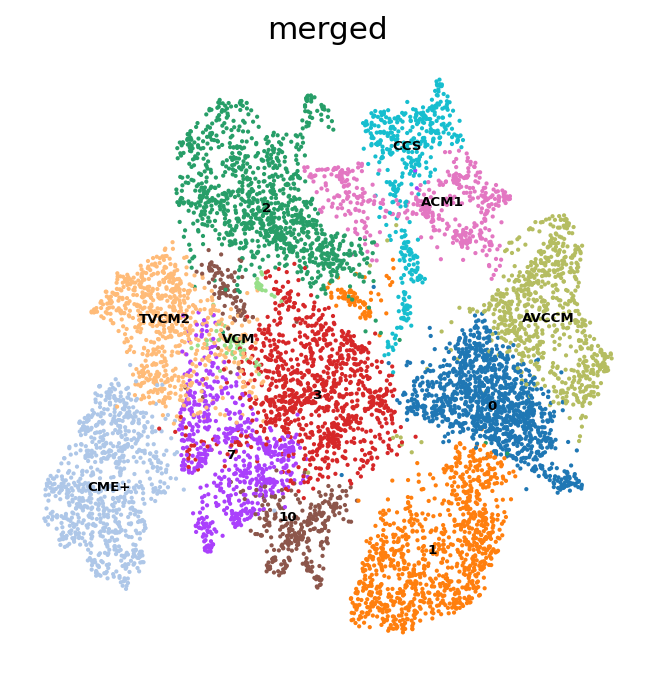

In [27]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'CME+': ['4'], 'AVCCM': ['5'], 'TVCM2': ['6'], 'ACM1': ['8'],
    'CCS': ['9'], 'VCM': ['11','12'], '0': ['0'], '1': ['1'], '2': ['2'], '3': ['3'], '7': ['7'], '10': ['10']}

# Initialize empty column in cell metadata
adata.obs['merged'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden).isin(cell_dict[i])
    adata.obs.loc[ind,'merged'] = i

sc.pl.umap(adata, color=['merged'], legend_loc='on data', legend_fontsize=6, save='_merged_new_lbl')

/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


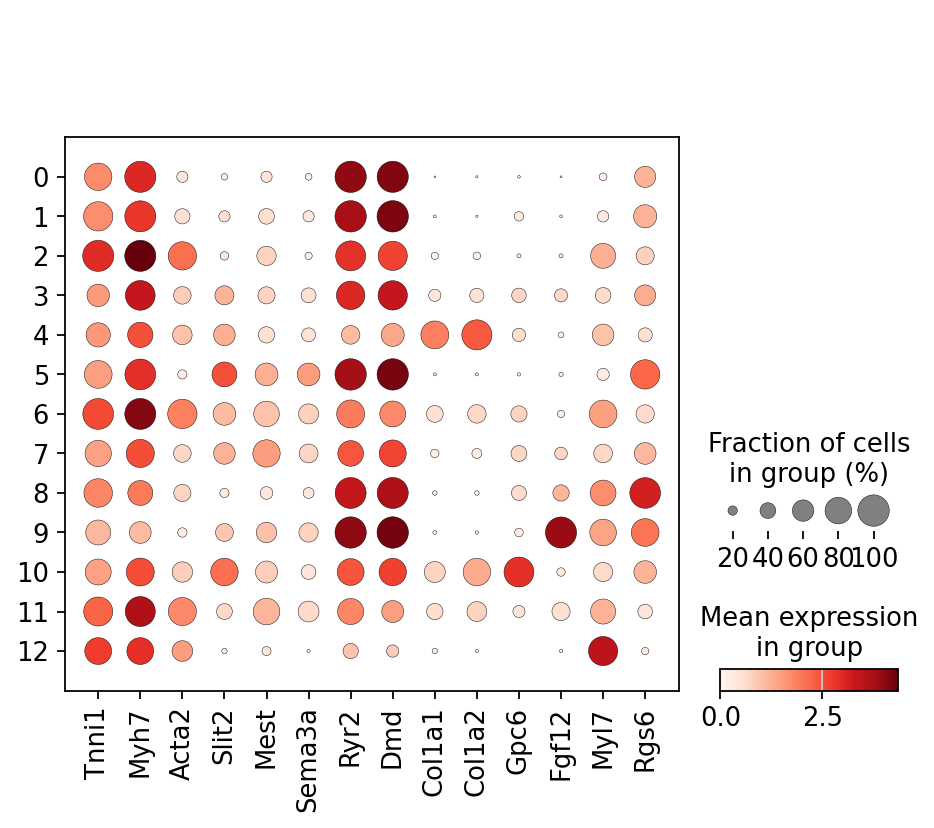

In [28]:
sc.pl.dotplot(adata, [i for i in gene_list], groupby='leiden');

In [29]:
adata.obs.rename({'merged': 'celltype'}, inplace = True, axis = 1)


/home/ch250798/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


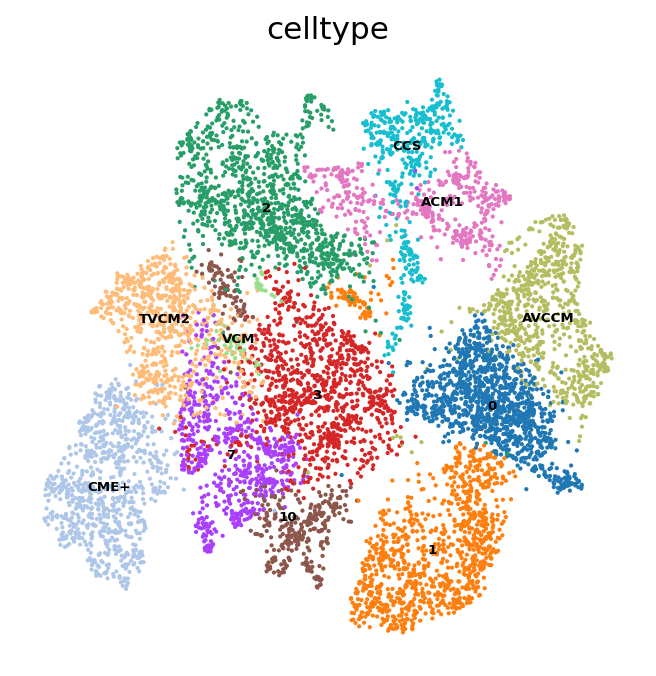

In [30]:
sc.pl.umap(adata, color=['celltype'], legend_loc='on data', legend_fontsize=6, save='_merged_new_lbl')

In [31]:
adata.write(os.path.join(work_dir, 'scRNA/adata.h5ad'), compression='gzip')

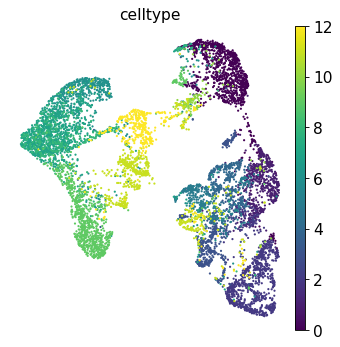

In [17]:
sc.pl.umap(adata, color = ['celltype'], legend_fontsize=6)



In [18]:
adata

AnnData object with n_obs × n_vars = 7829 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_SCT', 'nFeature_SCT', 'SCT.weight', 'ATAC.weight', 'wsnn_res.0.8', 'seurat_clusters', 'sample', 'celltype.stim', 'celltype', 'CM41'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'celltype.stim_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'